
# IceVision Bboxes - Real Data

*This is a mashup of IceVision's "[Custom Parser](https://airctic.com/0.8.0/custom_parser/)" example and their ["Getting Started (Object Detection)"](https://airctic.com/0.8.0/getting_started_object_detection/) notebooks, to analyze SPNet Real dataset, for which I [generated bounding boxes](https://github.com/drscotthawley/SPNet/blob/master/gen_bboxes_csv.py). -- S.H. Hawley, July 1, 2021*

## Installing IceVision and IceData
If on Colab run the following cell, else check the [installation instructions](https://airctic.com/dev/install/)

In [1]:
# IceVision - IceData - MMDetection - YOLO v5 Installation
#try:
#    !wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
#    !chmod +x install_colab.sh && ./install_colab.sh
#except:
#    print("Ignore the error messages and just keep going")

In [2]:
#all_slow

In [1]:
# system info
import torch, re 
tv, cv = torch.__version__, torch.version.cuda
tv = re.sub('\+cu.*','',tv)
TORCH_VERSION = 'torch'+tv[0:-1]+'0'
CUDA_VERSION = 'cu'+cv.replace('.','')

print(f"TORCH_VERSION={TORCH_VERSION}; CUDA_VERSION={CUDA_VERSION}")
print(f"CUDA available = {torch.cuda.is_available()}, Device count = {torch.cuda.device_count()}, Current device = {torch.cuda.current_device()}")
print(f"Device name = {torch.cuda.get_device_name()}")
print("hostname:")
!hostname

TORCH_VERSION=torch1.8.0; CUDA_VERSION=cu102
CUDA available = True, Device count = 1, Current device = 0
Device name = TITAN X (Pascal)
hostname:
lecun


In [2]:
# For local Icevision Install of MMD.  cf. https://airctic.com/0.8.1/install/
#!pip install -qq mmcv-full=="1.3.8" -f https://download.openmmlab.com/mmcv/dist/{CUDA_VERSION}/{TORCH_VERSION}/index.html --upgrade
#!pip install mmdet -qq

## Imports
As always, let's import everything from `icevision`. Additionally, we will also need `pandas` (you might need to install it with `pip install pandas`).

In [3]:
from icevision.all import *
import pandas as pd

INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /home/shawley/.icevision/mmdetection_configs/mmdetection_configs-2.10.0/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:17


## Download dataset

We're going to be using a small sample of the chess dataset, the full dataset is offered by roboflow [here](https://public.roboflow.com/object-detection/chess-full)

In [4]:
#data_url = "https://github.com/airctic/chess_sample/archive/master.zip"
#data_dir = icedata.load_data(data_url, 'chess_sample') / 'chess_sample-master'

# SPNET Real Dataset link (currently proprietary, thus link may not work)
#data_url = "https://hedges.belmont.edu/~shawley/spnet_sample-master.zip"
#data_dir = icedata.load_data(data_url, 'spnet_sample') / 'spnet_sample-master' 

# public espiownage cyclegan dataset:
#data_url = 'https://hedges.belmont.edu/~shawley/espiownage-cyclegan.tgz'
#data_dir = icedata.load_data(data_url, 'espiownage-cyclegan') / 'espiownage-cyclegan'

# local data already there:
from pathlib import Path
data_dir = Path('/home/shawley/datasets/espiownage-cleaner')  # real data is local and private

## Understand the data format

In this task we were given a `.csv` file with annotations, let's take a look at that.

!!! danger "Important"  
    Replace `source` with your own path for the dataset directory.

In [5]:
df = pd.read_csv(data_dir / "bboxes/annotations.csv")
df.head()

,filename,width,height,label,xmin,ymin,xmax,ymax
0,06240907_proc_00254.png,512,384,1,31,135,184,290
1,06240907_proc_00256.png,512,384,0,65,153,168,270
2,06240907_proc_00270.png,512,384,1,45,149,164,280
3,06240907_proc_00281.png,512,384,10,0,111,185,340
4,06240907_proc_00281.png,512,384,1,254,134,353,215


At first glance, we can make the following assumptions:  

  * Multiple rows with the **same** filename, width, height  
  * A **label** for each row
  * A **bbox** [xmin, ymin, xmax, ymax] for each row  
  
Once we know what our data provides we can create our custom `Parser`.  

In [6]:
set(np.array(df['label']).flatten())

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11}

In [7]:
#df['label'] =  "_"+df['label'].apply(str)   # force label to be string-like
#df['label'] = ["Object"]*len(df)#  "_"+df['label'].apply(str)   # force label to be string-like

In [8]:
df['label'] /= 2
#df.head()
df['label'] = df['label'].apply(int) 
print(set(np.array(df['label']).flatten()))
df['label'] = "_"+df['label'].apply(str)+"_"

{0, 1, 2, 3, 4, 5}


In [9]:
df.head()

,filename,width,height,label,xmin,ymin,xmax,ymax
0,06240907_proc_00254.png,512,384,_0_,31,135,184,290
1,06240907_proc_00256.png,512,384,_0_,65,153,168,270
2,06240907_proc_00270.png,512,384,_0_,45,149,164,280
3,06240907_proc_00281.png,512,384,_5_,0,111,185,340
4,06240907_proc_00281.png,512,384,_0_,254,134,353,215


In [10]:
# ***OR*** we can just make them all the same object:
df['label'] = 'AN'  # antinode
df.head()

,filename,width,height,label,xmin,ymin,xmax,ymax
0,06240907_proc_00254.png,512,384,AN,31,135,184,290
1,06240907_proc_00256.png,512,384,AN,65,153,168,270
2,06240907_proc_00270.png,512,384,AN,45,149,164,280
3,06240907_proc_00281.png,512,384,AN,0,111,185,340
4,06240907_proc_00281.png,512,384,AN,254,134,353,215


## Create the Parser

The first step is to create a template record for our specific type of dataset, in this case we're doing standard object detection:

In [11]:
template_record = ObjectDetectionRecord()

Now use the method `generate_template` that will print out all the necessary steps we have to implement.

In [12]:
Parser.generate_template(template_record)

class MyParser(Parser):
    def __init__(self, template_record):
        super().__init__(template_record=template_record)
    def __iter__(self) -> Any:
    def __len__(self) -> int:
    def record_id(self, o: Any) -> Hashable:
    def parse_fields(self, o: Any, record: BaseRecord, is_new: bool):
        record.set_img_size(<ImgSize>)
        record.set_filepath(<Union[str, Path]>)
        record.detection.add_bboxes(<Sequence[BBox]>)
        record.detection.set_class_map(<ClassMap>)
        record.detection.add_labels(<Sequence[Hashable]>)


We can copy the template and use it as our starting point. Let's go over each of the methods we have to define:

- `__init__`: What happens here is completely up to you, normally we have to pass some reference to our data, `data_dir` in our case.

- `__iter__`: This tells our parser how to iterate over our data, each item returned here will be passed to `parse_fields` as `o`. In our case we call `df.itertuples` to iterate over all `df` rows.

- `__len__`: How many items will be iterating over.

- `imageid`: Should return a `Hashable` (`int`, `str`, etc). In our case we want all the dataset items that have the same `filename` to be unified in the same record.

- `parse_fields`: Here is where the attributes of the record are collected, the template will suggest what methods we need to call on the record and what parameters it expects. The parameter `o` it receives is the item returned by `__iter__`.

!!! danger "Important"  
    Be sure to pass the correct type on all record methods!

In [13]:
class BBoxParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)
        
        self.data_dir = data_dir
        self.df = pd.read_csv(data_dir / "bboxes/annotations.csv")
        #self.df['label'] /= 2
        #self.df['label'] = self.df['label'].apply(int) 
        #self.df['label'] = "_"+self.df['label'].apply(str)+"_"
        self.df['label'] = 'AN'  # make them all the same object
        self.class_map = ClassMap(list(self.df['label'].unique()))
        
    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o
        
    def __len__(self) -> int:
        return len(self.df)
        
    def record_id(self, o) -> Hashable:
        return o.filename
        
    def parse_fields(self, o, record, is_new):
        if is_new:
            record.set_filepath(self.data_dir / 'images' / o.filename)
            record.set_img_size(ImgSize(width=o.width, height=o.height))
            record.detection.set_class_map(self.class_map)
        
        record.detection.add_bboxes([BBox.from_xyxy(o.xmin, o.ymin, o.xmax, o.ymax)])
        record.detection.add_labels([o.label])

Let's randomly split the data and parser with `Parser.parse`:

In [14]:
parser = BBoxParser(template_record, data_dir)

In [15]:
train_records, valid_records = parser.parse()

  0%|          | 0/5812 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/1564 [00:00<?, ?it/s]

  0%|          | 0/391 [00:00<?, ?it/s]

Let's take a look at one record:

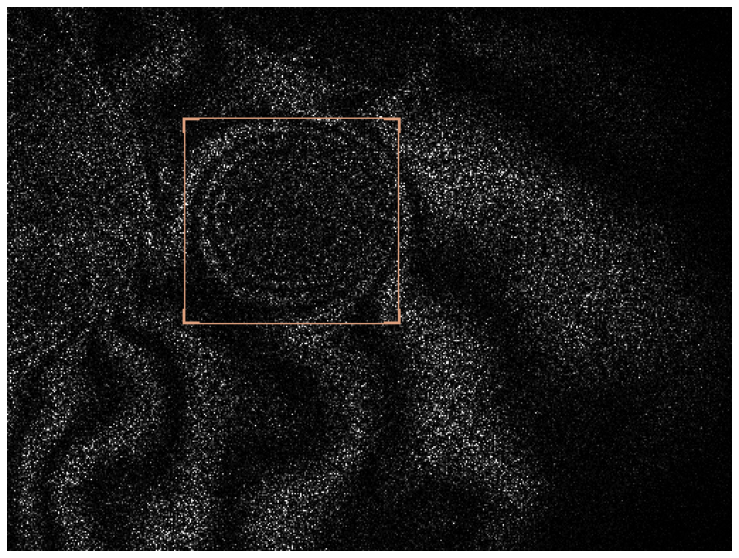

In [16]:
show_record(train_records[5], display_label=False, figsize=(14, 10))

In [17]:
train_records[0]

BaseRecord

common: 
	- Record ID: 58
	- Image size ImgSize(width=512, height=384)
	- Filepath: /home/shawley/datasets/espiownage-cleaner/images/06240907_proc_00417.png
	- Img: None
detection: 
	- BBoxes: [<BBox (xmin:0, ymin:105, xmax:192, ymax:338)>, <BBox (xmin:229, ymin:161, xmax:352, ymax:262)>]
	- Class Map: <ClassMap: {'background': 0, 'AN': 1}>
	- Labels: [1, 1]

## Moving On...
*Following the Getting Started "refrigerator" notebook...*

In [18]:
# Transforms
# size is set to 384 because EfficientDet requires its inputs to be divisible by 128
image_size = 384  
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=512), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

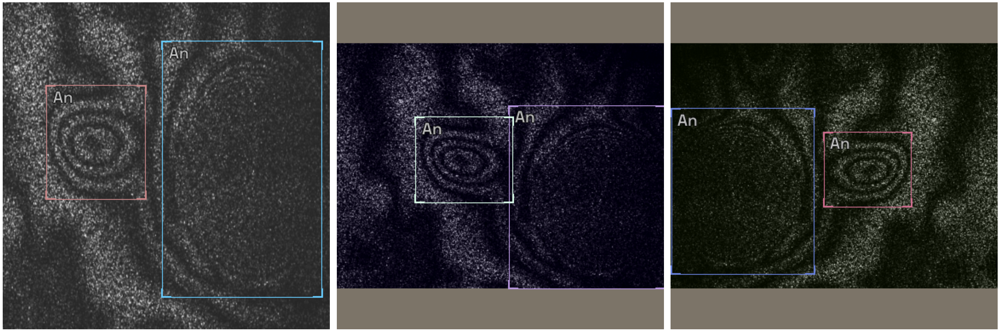

In [19]:
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3)

In [20]:
model_type = models.mmdet.retinanet
backbone = model_type.backbones.resnet50_fpn_1x(pretrained=True)

In [21]:
# Just change the value of selection to try another model

selection = 0

extra_args = {}

if selection == 0:
  model_type = models.mmdet.retinanet
  backbone = model_type.backbones.resnet50_fpn_1x

elif selection == 1:
  # The Retinanet model is also implemented in the torchvision library
  model_type = models.torchvision.retinanet
  backbone = model_type.backbones.resnet50_fpn

elif selection == 2:
  model_type = models.ross.efficientdet
  backbone = model_type.backbones.tf_lite0
  # The efficientdet model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 3:
  model_type = models.ultralytics.yolov5
  backbone = model_type.backbones.small
  # The yolov5 model requires an img_size parameter
  extra_args['img_size'] = image_size

model_type, backbone, extra_args

(<module 'icevision.models.mmdet.models.retinanet' from '/home/shawley/envs/icevision/lib/python3.8/site-packages/icevision/models/mmdet/models/retinanet/__init__.py'>,
 {})

In [22]:
# Instantiate the mdoel
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map), **extra_args) 

/home/shawley/envs/icevision/lib/python3.8/site-packages/mmdet/core/anchor/builder.py:16: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  warnings.warn(


Use load_from_local loader
The model and loaded state dict do not match exactly

size mismatch for bbox_head.retina_cls.weight: copying a param with shape torch.Size([720, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([9, 256, 3, 3]).
size mismatch for bbox_head.retina_cls.bias: copying a param with shape torch.Size([720]) from checkpoint, the shape in current model is torch.Size([9]).


In [23]:
# Data Loaders
train_dl = model_type.train_dl(train_ds, batch_size=8, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=8, num_workers=4, shuffle=False)

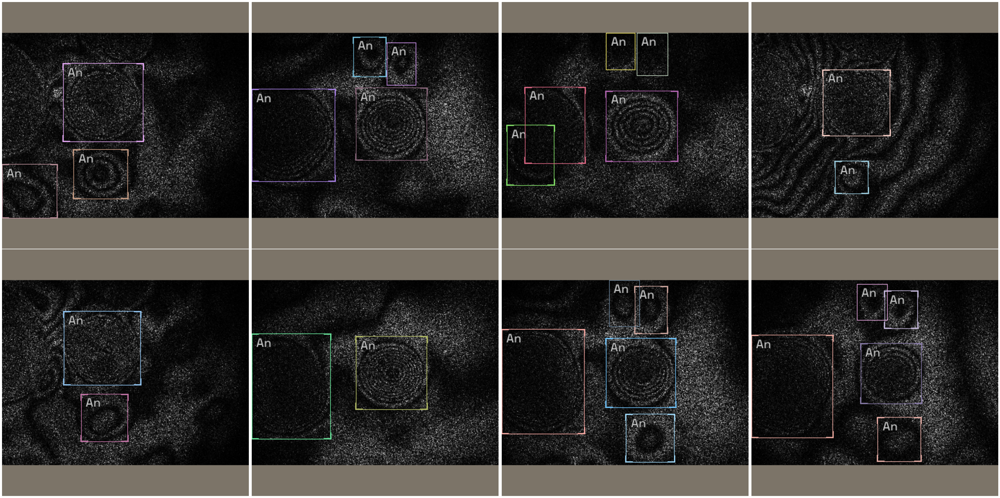

In [24]:
# show batch - target data
model_type.show_batch(first(valid_dl), ncols=4)

In [25]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

In [26]:
# use the fastai bindings
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

/home/shawley/envs/icevision/lib/python3.8/site-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/home/shawley/envs/icevision/lib/python3.8/site-packages/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  warnings.warn(


SuggestedLRs(lr_min=7.945936522446573e-05, lr_steep=6.597539322683588e-05)

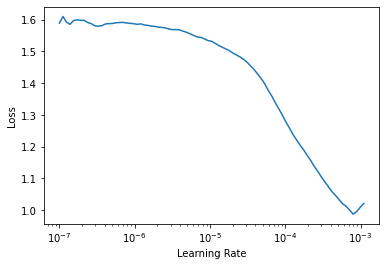

In [26]:
learn.lr_find(end_lr=0.005)

# For Sparse-RCNN, use lower `end_lr`
# learn.lr_find(end_lr=0.005)

In [27]:
learn.fine_tune(60, 7e-5, freeze_epochs=2)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.720761,0.500148,0.475057,00:51
1,0.467032,0.424952,0.526241,00:48


epoch,train_loss,valid_loss,COCOMetric,time
0,0.401495,0.366908,0.598216,00:55
1,0.387994,0.359718,0.585890,00:54
2,0.362751,0.344039,0.599286,00:53
3,0.361480,0.335245,0.616614,00:54
4,0.358037,0.337374,0.602294,00:53
5,0.348905,0.322019,0.622001,00:54
6,0.342799,0.310715,0.638099,00:53
7,0.333430,0.306771,0.638176,00:54
8,0.322321,0.304977,0.642818,00:53
9,0.319668,0.304358,0.639192,00:54


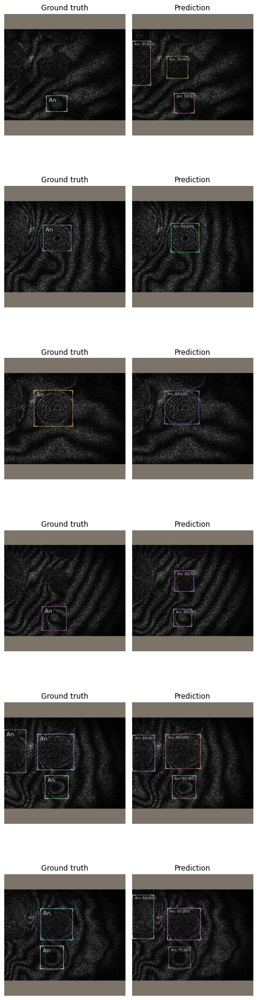

In [28]:
model_type.show_results(model, valid_ds, detection_threshold=.5)

In [29]:
learn.save('iv_bbox_real')

Path('models/iv_bbox_real.pth')

## Inference
Might get a CUDA OOM error here. If so, restart kernel and load what we just saved. You'll have to go back and re-define learn, model, valid_ds etc., though. 

In [27]:
learn.load('iv_bbox_real')

In [28]:
preds = model_type.predict(model, valid_ds, keep_images=True)

/home/shawley/envs/icevision/lib/python3.8/site-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/home/shawley/envs/icevision/lib/python3.8/site-packages/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  warnings.warn(


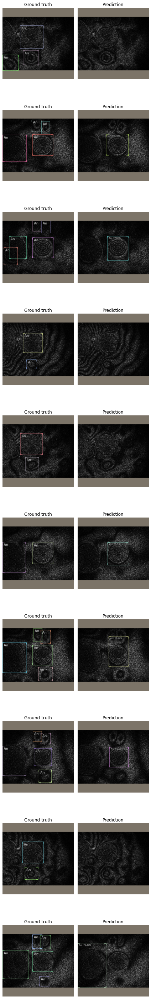

In [29]:
show_preds(preds=preds[0:10])

In [31]:
len(train_ds), len(valid_ds), len(preds)

(1564, 391, 391)

let's try to figure out how to get what we want from these predictions.  hmmm

In [32]:
preds[0].pred

BaseRecord

common: 
	- Image size ImgSize(width=384, height=384)
	- Record ID: 1283
	- Img: 384x384x3 <np.ndarray> Image
detection: 
	- Scores: []
	- Class Map: <ClassMap: {'background': 0, 'AN': 1}>
	- Labels: []
	- BBoxes: []

In [35]:
preds[1].pred.detection.scores

array([0.74782693], dtype=float32)

In [36]:
preds[1].pred.detection.bboxes

[<BBox (xmin:157.4410400390625, ymin:131.0904541015625, xmax:273.8079528808594, ymax:248.00094604492188)>]

In [38]:
preds[1].pred.detection.bboxes[0].xmin

def get_bblist(pred):
    my_bblist = []
    bblist = pred.pred.detection.bboxes
    for i in range(len(bblist)):
        my_bblist.append([bblist[i].xmin, bblist[i].ymin, bblist[i].xmax, bblist[i].ymax])
    return my_bblist

get_bblist(preds[1])      

[[157.44104, 131.09045, 273.80795, 248.00095]]

In [39]:
preds[3].pred

BaseRecord

common: 
	- Image size ImgSize(width=384, height=384)
	- Record ID: 1385
	- Img: 384x384x3 <np.ndarray> Image
detection: 
	- Class Map: <ClassMap: {'background': 0, 'AN': 1}>
	- Labels: []
	- Scores: []
	- BBoxes: []

In [40]:
results = []
for i in range(len(preds)):
    if (len(preds[i].pred.detection.scores) == 0): continue   # sometimes you get a zero box/prediction. ??
    #print(f"i = {i}, file = {str(Path(valid_ds[i].common.filepath).stem)+'.csv'}, bboxes = {get_bblist(preds[i])}, scores={preds[i].pred.detection.scores}\n")
    worst_score = np.min(np.array(preds[i].pred.detection.scores))
    line_list = [str(Path(valid_ds[i].common.filepath).stem)+'.csv', get_bblist(preds[i]), preds[i].pred.detection.scores, worst_score, i]
    results.append(line_list)
    
# store as pandas dataframe
res_df = pd.DataFrame(results, columns=['filename', 'bblist','scores','worst_score','i'])
res_df = res_df.sort_values('worst_score')  # order by worst score as a "top losses" kind of thing
res_df.head() # take a look

,filename,bblist,scores,worst_score,i
16,06241902_proc_00857.csv,"[[101.7664, 97.137886, 214.55583, 225.27325]]",[0.50051755],0.500518,33
99,06240907_proc_00556.csv,"[[0.0, 34.046432, 157.73097, 326.12262]]",[0.50141394],0.501414,254
52,06240907_proc_00724.csv,"[[173.59372, 135.70735, 271.25345, 242.49944]]",[0.502879],0.502879,147
45,06240907_proc_00725.csv,"[[209.86786, 52.368305, 265.12656, 128.56065]]",[0.5033824],0.503382,126
103,06240907_proc_00299.csv,"[[0.0, 83.26705, 149.51791, 328.78644]]",[0.5035457],0.503546,264


In [41]:
res_df.to_csv('bboxes_top_losses_real.csv', index=False)